# Spotify Song Suggester

## The Problem:
Need to create a model to give predictions of songs that a user might like based on music they already like.

## Resources:
- [DS PT Schedule / Milestones](https://www.notion.so/f30da0c13d5247289bd5ade8d95af4a8?v=c97929c27fe24af780928a5a91a8b095)
- [DS Unit 3 Rubric](https://www.notion.so/Data-Science-Unit-3-Rubric-455c04d97fb840c6b75d46e8052a5275)
- [DS Unit 4 Rubric](https://www.notion.so/Data-Science-Unit-4-Rubric-1f7381be7b924da2a83c086c2bf97d3b)

## The Data:
Looking for data that not only gives the artist and title of a song, but the lyrics too.

### Possible Datasets:
- most_popular_spotify_songs.csv
- [billboard-lyrics-spotify.csv](https://github.com/walkerkq/musiclyrics/blob/master/billboard_lyrics_1964-2015.csv)
- [Spotify API](https://developer.spotify.com/documentation/web-api/quick-start/)
- [musiXmatch Dataset API](http://millionsongdataset.com/musixmatch/)
- Scrape the web for lyrics to match to Spotify song list.

In [1]:
# If running on Google Colab
!pip install pandas-profiling==2.*
from google.colab import output # to clear pip output to screen
output.clear()

In [2]:
# Install squarify
!pip install squarify

In [3]:
# Imports
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import pickle
from collections import Counter

from pandas_profiling import ProfileReport

# Sci-Kit Learn
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors
from sklearn.feature_extraction.text import CountVectorizer, ENGLISH_STOP_WORDS

# NLP
import re
from nltk.stem import PorterStemmer
import spacy
from spacy.tokenizer import Tokenizer

# PLotting
import squarify
import matplotlib.pyplot as plt
import seaborn as sns

from gensim.models import Word2Vec

In [4]:
# Read in dataset
song_df = pd.read_csv('https://raw.githubusercontent.com/Spotify-DSPT-158/Build-Week-Spotify/main/spotify_songs.csv')

# Peak at the dataset
print(song_df.shape)
song_df.head()

(18454, 25)


,track_id,track_name,track_artist,lyrics,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,language
0,0017A6SJgTbfQVU2EtsPNo,Pangarap,Barbie's Cradle,Minsan pa Nang ako'y napalingon Hindi ko alam ...,41,1srJQ0njEQgd8w4XSqI4JQ,Trip,2001-01-01,Pinoy Classic Rock,37i9dQZF1DWYDQ8wBxd7xt,rock,classic rock,0.682,0.401,2,-10.068,1,0.0236,0.27900,0.01170,0.0887,0.566,97.091,235440,tl
1,004s3t0ONYlzxII9PLgU6z,I Feel Alive,Steady Rollin,"The trees, are singing in the wind The sky blu...",28,3z04Lb9Dsilqw68SHt6jLB,Love & Loss,2017-11-21,Hard Rock Workout,3YouF0u7waJnolytf9JCXf,rock,hard rock,0.303,0.880,9,-4.739,1,0.0442,0.01170,0.00994,0.3470,0.404,135.225,373512,en
2,00chLpzhgVjxs1zKC9UScL,Poison,Bell Biv DeVoe,"NA Yeah, Spyderman and Freeze in full effect U...",0,6oZ6brjB8x3GoeSYdwJdPc,Gold,2005-01-01,"Back in the day - R&B, New Jack Swing, Swingbe...",3a9y4eeCJRmG9p4YKfqYIx,r&b,new jack swing,0.845,0.652,6,-7.504,0,0.2160,0.00432,0.00723,0.4890,0.650,111.904,262467,en
3,00cqd6ZsSkLZqGMlQCR0Zo,Baby It's Cold Outside (feat. Christina Aguilera),CeeLo Green,I really can't stay Baby it's cold outside I'v...,41,3ssspRe42CXkhPxdc12xcp,CeeLo's Magic Moment,2012-10-29,Christmas Soul,6FZYc2BvF7tColxO8PBShV,r&b,neo soul,0.425,0.378,5,-5.819,0,0.0341,0.68900,0.00000,0.0664,0.405,118.593,243067,en
4,00emjlCv9azBN0fzuuyLqy,Dumb Litty,KARD,Get up out of my business You don't keep me fr...,65,7h5X3xhh3peIK9Y0qI5hbK,KARD 2nd Digital Single ‘Dumb Litty’,2019-09-22,K-Party Dance Mix,37i9dQZF1DX4RDXswvP6Mj,pop,dance pop,0.760,0.887,9,-1.993,1,0.0409,0.03700,0.00000,0.1380,0.240,130.018,193160,en


In [5]:
# Drop columns not needed for our problem
songs = song_df.drop(columns=['track_album_id', 'track_album_name', 'playlist_id'])
print(songs.shape)
songs.head()

(18454, 22)


,track_id,track_name,track_artist,lyrics,track_popularity,track_album_release_date,playlist_name,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,language
0,0017A6SJgTbfQVU2EtsPNo,Pangarap,Barbie's Cradle,Minsan pa Nang ako'y napalingon Hindi ko alam ...,41,2001-01-01,Pinoy Classic Rock,rock,classic rock,0.682,0.401,2,-10.068,1,0.0236,0.27900,0.01170,0.0887,0.566,97.091,235440,tl
1,004s3t0ONYlzxII9PLgU6z,I Feel Alive,Steady Rollin,"The trees, are singing in the wind The sky blu...",28,2017-11-21,Hard Rock Workout,rock,hard rock,0.303,0.880,9,-4.739,1,0.0442,0.01170,0.00994,0.3470,0.404,135.225,373512,en
2,00chLpzhgVjxs1zKC9UScL,Poison,Bell Biv DeVoe,"NA Yeah, Spyderman and Freeze in full effect U...",0,2005-01-01,"Back in the day - R&B, New Jack Swing, Swingbe...",r&b,new jack swing,0.845,0.652,6,-7.504,0,0.2160,0.00432,0.00723,0.4890,0.650,111.904,262467,en
3,00cqd6ZsSkLZqGMlQCR0Zo,Baby It's Cold Outside (feat. Christina Aguilera),CeeLo Green,I really can't stay Baby it's cold outside I'v...,41,2012-10-29,Christmas Soul,r&b,neo soul,0.425,0.378,5,-5.819,0,0.0341,0.68900,0.00000,0.0664,0.405,118.593,243067,en
4,00emjlCv9azBN0fzuuyLqy,Dumb Litty,KARD,Get up out of my business You don't keep me fr...,65,2019-09-22,K-Party Dance Mix,pop,dance pop,0.760,0.887,9,-1.993,1,0.0409,0.03700,0.00000,0.1380,0.240,130.018,193160,en


In [6]:
# Rename features to make it easier to work with
songs = songs.rename(columns={'track_id': 'id', 'track_name': 'title' , 
                              'track_artist': 'artist', 
                              'track_popularity': 'popularity',
                              'track_album_release_date': 'release_date',
                              'playlist_name': 'playlist', 
                              'playlist_genre': 'genre',
                              'playlist_subgenre': 'subgenre'})

songs.head()

,id,title,artist,lyrics,popularity,release_date,playlist,genre,subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,language
0,0017A6SJgTbfQVU2EtsPNo,Pangarap,Barbie's Cradle,Minsan pa Nang ako'y napalingon Hindi ko alam ...,41,2001-01-01,Pinoy Classic Rock,rock,classic rock,0.682,0.401,2,-10.068,1,0.0236,0.27900,0.01170,0.0887,0.566,97.091,235440,tl
1,004s3t0ONYlzxII9PLgU6z,I Feel Alive,Steady Rollin,"The trees, are singing in the wind The sky blu...",28,2017-11-21,Hard Rock Workout,rock,hard rock,0.303,0.880,9,-4.739,1,0.0442,0.01170,0.00994,0.3470,0.404,135.225,373512,en
2,00chLpzhgVjxs1zKC9UScL,Poison,Bell Biv DeVoe,"NA Yeah, Spyderman and Freeze in full effect U...",0,2005-01-01,"Back in the day - R&B, New Jack Swing, Swingbe...",r&b,new jack swing,0.845,0.652,6,-7.504,0,0.2160,0.00432,0.00723,0.4890,0.650,111.904,262467,en
3,00cqd6ZsSkLZqGMlQCR0Zo,Baby It's Cold Outside (feat. Christina Aguilera),CeeLo Green,I really can't stay Baby it's cold outside I'v...,41,2012-10-29,Christmas Soul,r&b,neo soul,0.425,0.378,5,-5.819,0,0.0341,0.68900,0.00000,0.0664,0.405,118.593,243067,en
4,00emjlCv9azBN0fzuuyLqy,Dumb Litty,KARD,Get up out of my business You don't keep me fr...,65,2019-09-22,K-Party Dance Mix,pop,dance pop,0.760,0.887,9,-1.993,1,0.0409,0.03700,0.00000,0.1380,0.240,130.018,193160,en


In [7]:
# Peak a lyrics value
songs.lyrics[2]

'NA Yeah, Spyderman and Freeze in full effect Uh-huh You ready, Ron? I\'m ready You ready, Biv? I\'m ready, Slick, are you? Oh, yeah, break it down NA Girl, I, must (warn you) I sense something strange in my mind Situation is (serious) Let\'s cure it cause we\'re running out of time It\'s oh, so (beautiful) Relationships they seem from the start It\'s all so (deadly) When love is not together from the heart It\'s drivin\' me out of my mind! That\'s why it\'s HARD for me to find Can\'t get it out of my head! Miss her, kiss her, love her(Wrong move you\'re dead!) That girl is (poison)...Never trust a big butt and smile That girl is (poison)..("POISON!!") NA (-caution) Before I start to meet a fly girl, you know? Cause in some (portions) You\'ll think she\'s the best thing in the world She\'s so - (fly) She\'ll drive you right out of your mind And steal your heart when you\'re blind Beware she\'s schemin\', she\'ll make you think you\'re dreamin\' YOU\'LL fall in love and you\'ll be screa

In [8]:
profile = ProfileReport(songs, explorative=True)
profile

In [9]:
# Look at values in lyrics
songs['lyrics'].value_counts()

Lyrics for this song have yet to be released. Please check back once the song has been released.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

In [10]:
# Remove rows that have no lyrics or "Instrumental"
songs = songs[songs['lyrics'].notna()]
no_lyrics_yet = songs[songs['lyrics'] == 'Lyrics for this song have yet to be released. Please check back once the song has been released.'].index
songs.drop(no_lyrics_yet, inplace=True)
no_lyrics_NA = songs[songs['lyrics'] == 'NA NA'].index
songs.drop(no_lyrics_NA, inplace=True)
print(songs.shape)

(18127, 22)


In [11]:
# Create function to tokenize a list of words
def tokens(text):
  '''
  Parses a string into a list of sementic units (words)0

  Args:
    text (str): A string of values to be tokenized

  Returns:
    list of tokens
  '''

  # remove all non-alpha numeric characters
  tokens = re.sub('[^a-z A-Z 0-9]', '', text)
  
  # Lowercase all and split on spaces
  tokens = tokens.lower().split()

  return tokens

In [12]:
# Tokenize the lyrics
songs['tokens'] = songs['lyrics'].apply(tokens)

# Compare the lyrics to tokens
songs[['lyrics', 'tokens']][:5]

,lyrics,tokens
0,Minsan pa Nang ako'y napalingon Hindi ko alam ...,"[minsan, pa, nang, akoy, napalingon, hindi, ko..."
1,"The trees, are singing in the wind The sky blu...","[the, trees, are, singing, in, the, wind, the,..."
2,"NA Yeah, Spyderman and Freeze in full effect U...","[na, yeah, spyderman, and, freeze, in, full, e..."
3,I really can't stay Baby it's cold outside I'v...,"[i, really, cant, stay, baby, its, cold, outsi..."
4,Get up out of my business You don't keep me fr...,"[get, up, out, of, my, business, you, dont, ke..."


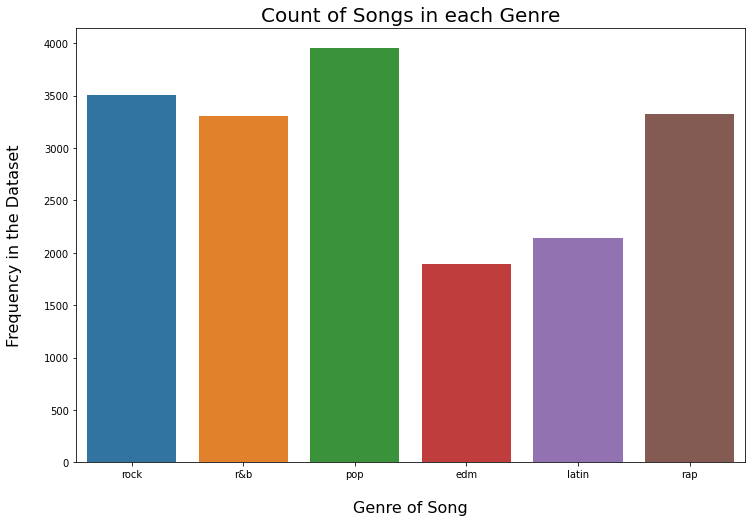

In [13]:
# Graph the count of songs per genre
plt.figure(figsize=(12,8), facecolor='white')
ax = sns.countplot(x='genre', data=songs)
plt.title('Count of Songs in each Genre', fontdict={'size':20})
plt.xlabel('\nGenre of Song', fontdict={'size':16})
plt.ylabel('Frequency in the Dataset\n', fontdict={'size':16});

This dataset (spotify_songs.csv) is not diverse in genres but has lyrics and is large enough to train a good model on.

In [14]:
# Load in another dataset to look EDA on it
bbsongs = pd.read_csv('https://raw.githubusercontent.com/Spotify-DSPT-158/Build-Week-Spotify/Joanne-EDA-1/billboard-lyrics-spotify.csv')
print(bbsongs.shape)
bbsongs.head()

(5566, 30)


,artist_all,artist_base,rank,song,year,artist_featured,song_clean,artist_clean,lyrics,acousticness,danceability,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,release_date,speechiness,tempo,time_signature,valence,duration_min,num_words,words_per_sec,num_uniq_words,decade,uniq_ratio
0,percy faith,percy faith,1,theme from a summer place,1960,NaN,theme from a summer place,percy faith,theres a summer place where it may rain or sto...,0.631,0.466,0.3890,0.0,0.843000,5.0,0.295,-12.825,1.0,49.0,1953,0.0253,92.631,4.0,0.749,2.414883,104.0,0.717771,58.0,1960,1.793103
1,jim reeves,jim reeves,2,he'll have to go,1960,NaN,hell have to go,jim reeves,put your sweet lips a little closer to the pho...,0.909,0.554,0.1860,0.0,0.001440,1.0,0.110,-15.846,1.0,53.0,1997-02-14,0.0379,81.181,3.0,0.200,2.310667,152.0,1.096365,69.0,1960,2.202899
2,the everly brothers,the everly brothers,3,cathy's clown,1960,NaN,cathys clown,the everly brothers,dont want your love any more dont want your k...,0.412,0.498,0.5820,0.0,0.000000,7.0,0.372,-8.961,1.0,50.0,1962-06-01,0.0339,119.809,4.0,0.866,2.400217,121.0,0.840202,64.0,1960,1.890625
3,johnny preston,johnny preston,4,running bear,1960,NaN,running bear,johnny preston,on the bank of the river stood running bear yo...,0.854,0.772,0.2970,0.0,0.000008,5.0,0.125,-14.679,0.0,40.0,2013-09-01,0.0530,119.987,4.0,0.822,2.636667,220.0,1.390645,89.0,1960,2.471910
4,mark dinning,mark dinning,5,teen angel,1960,NaN,teen angel,mark dinning,teen angel teen angel teen angel that fateful ...,0.936,0.570,0.0636,0.0,0.000000,0.0,0.122,-18.548,1.0,18.0,2005,0.0459,101.517,4.0,0.282,2.664883,109.0,0.681706,73.0,1960,1.493151


In [15]:
bbsongs.columns

Index(['artist_all', 'artist_base', 'rank', 'song', 'year', 'artist_featured',
       'song_clean', 'artist_clean', 'lyrics', 'acousticness', 'danceability',
       'energy', 'explicit', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'popularity', 'release_date', 'speechiness', 'tempo',
       'time_signature', 'valence', 'duration_min', 'num_words',
       'words_per_sec', 'num_uniq_words', 'decade', 'uniq_ratio'],
      dtype='object')

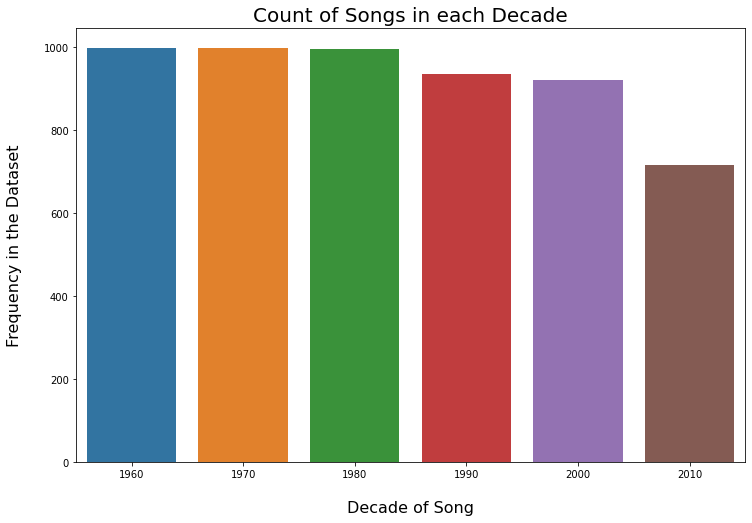

In [16]:
plt.figure(figsize=(12,8), facecolor='white')
ax = sns.countplot(x='decade', data=bbsongs)
plt.title('Count of Songs in each Decade', fontdict={'size':20})
plt.xlabel('\nDecade of Song', fontdict={'size':16})
plt.ylabel('Frequency in the Dataset\n', fontdict={'size':16});

This dataset (billboard-lyrics-spotify.csv) has lyrics and appears more deverse but no specified genre and is a small dataset.

In [17]:
# Look at another dataset and preform EDA
most_pop_songs = pd.read_csv('https://raw.githubusercontent.com/Spotify-DSPT-158/Build-Week-Spotify/Joanne-EDA-1/most_popular_spotify_songs.csv')
print(most_pop_songs.shape)
most_pop_songs.head()

(75022, 18)


,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,R&B,Mary J. Blige,Be Without You - Kendu Mix,2YegxR5As7BeQuVp2U6pek,65,0.0830,0.724,246333,0.689,0.000000,D,0.3040,-5.922,Minor,0.1350,146.496,4/4,0.6930
1,R&B,Rihanna,Desperado,6KFaHC9G178beAp7P0Vi5S,63,0.3230,0.685,186467,0.610,0.000000,C,0.1020,-5.221,Minor,0.0439,94.384,3/4,0.3230
2,R&B,Yung Bleu,Ice On My Baby (feat. Kevin Gates) - Remix,6muW8cSjJ3rusKJ0vH5olw,62,0.0675,0.762,199520,0.520,0.000004,F,0.1140,-5.237,Minor,0.0959,75.047,4/4,0.0862
3,R&B,Surfaces,Heaven Falls / Fall on Me,7yHqOZfsXYlicyoMt62yC6,61,0.3600,0.563,240597,0.366,0.002430,B,0.0955,-6.896,Minor,0.1210,85.352,4/4,0.7680
4,R&B,Olivia O'Brien,Love Myself,4XzgjxGKqULifVf7mnDIQK,68,0.5960,0.653,213947,0.621,0.000000,B,0.0811,-5.721,Minor,0.0409,100.006,4/4,0.4660


In [18]:
most_pop_songs.columns

Index(['genre', 'artist_name', 'track_name', 'track_id', 'popularity',
       'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence'],
      dtype='object')

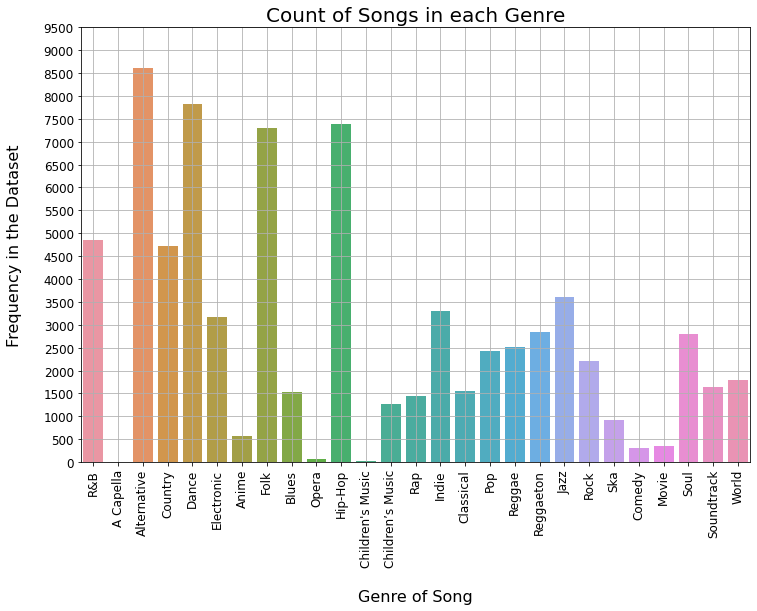

In [34]:
plt.figure(figsize=(12,8), facecolor='white')
ax = sns.countplot(x='genre', data=most_pop_songs)
plt.title('Count of Songs in each Genre', fontdict={'size':20})
plt.xlabel('\nGenre of Song', fontdict={'size':16})
plt.xticks(rotation=90, size=12)
plt.ylabel('Frequency in the Dataset\n', fontdict={'size':16})
plt.yticks(np.arange(0, 10000, 500), size=12)
plt.grid();

This dataset (most_popular_spotify_songs.csv) is more diverse but half as many observations as first dataset (spotify_songs.csv) and no lyrics.